### Data Augmentation (데이터 증강)
- 이미지의 종류와 개수가 적으면, CNN 모델의 성능이 떨어질 수 밖에 없다.
- 또한, 몇 안되는 이미지로 훈련시키면 과적합이 발생한다.
- CNN 모델의 성능을 높이고 과적합을 개선하기 위해서는 이미지의 종류와 개수가 많아야 한다.  
  즉, 데이터의 양을 늘려줘야 한다.
- 이미지 데이터는 학습 데이터를 수집하여 양을 늘리기 쉽지 않기 때문에,  
  원본 이미지를 변형시킴으로서 양을 늘릴 수 있다.
- Data Augmentation을 통해 원본 이미지에 다양한 변형을 주면,  
  학습에 사용하는 이미지 데이터를 늘리는 것과 유사한 효과를 볼 수 있다.
- 원본 학습 이미지의 개수를 늘리는 것이 아닌, 매 학습마다 개별적으로 원본 이미지를 변형해서 학습을 수행한다.

<img src='./images/data_augmentation.png' width='400px' style='margin-left: 30px;'>

<br>

#### 공간 레벨 변형
- 좌우 또는 상하 반전, 특정 영역만큼 확대, 축소, 회전 등으로 변형시킨다.

<img src='./images/spatial.png' width='500px'>

<br>

#### 픽셀 레벨 변형
- 밝기, 명암, 채도, 색상 등을 변형시킨다.

<img src='./images/pixel.png' width='200px' style='margin-left: 10px;'>

In [1]:
# translate.py 파일 읽어오기
with open('./datasets/animals/translate.py') as f:
    content = f.readline()

    # { 부터 }의 문자열을 읽어옴 (dict) 
    contents1 = eval(content[content.index('{'):content.index('}') + 1])

    # 위 dict 의 key, value 순서를 반대로 변경
    contents2 = {v: k for k, v in contents1.items()}

print(contents1, contents2, sep='\n')

{'cane': 'dog', 'cavallo': 'horse', 'elefante': 'elephant', 'farfalla': 'butterfly', 'gallina': 'chicken', 'gatto': 'cat', 'mucca': 'cow', 'pecora': 'sheep', 'scoiattolo': 'squirrel', 'dog': 'cane', 'elephant': 'elefante', 'butterfly': 'farfalla', 'chicken': 'gallina', 'cat': 'gatto', 'cow': 'mucca', 'spider': 'ragno', 'squirrel': 'scoiattolo'}
{'dog': 'cane', 'horse': 'cavallo', 'elephant': 'elefante', 'butterfly': 'farfalla', 'chicken': 'gallina', 'cat': 'gatto', 'cow': 'mucca', 'sheep': 'pecora', 'squirrel': 'scoiattolo', 'cane': 'dog', 'elefante': 'elephant', 'farfalla': 'butterfly', 'gallina': 'chicken', 'gatto': 'cat', 'mucca': 'cow', 'ragno': 'spider', 'scoiattolo': 'squirrel'}


In [2]:
from glob import glob
import os

root = './datasets/animals/original/'

# 위 root 경로 안 모든 파일명이 담긴 list 생성 - 동물 이름(영어 or 기타 외국어) 폴더들
directories = glob(os.path.join(root,'*'))

for directory in directories:
    # 폴더명을 영어로 변경
    try:
        os.rename(directory, os.path.join(root, contents1[directory[directory.rindex('\\') + 1:]]))
    except KeyError as e:
        os.rename(directory, os.path.join(root, contents2[directory[directory.rindex('\\') + 1:]]))

In [3]:
root = './datasets/animals/original/'

directories = glob(os.path.join(root,'*'))
directory_names = []

# root 경로 안 directory들의 이름 출력 (영어로 변환 잘 되었는지 확인)
for directory in directories:
    directory_names.append(directory[directory.rindex('\\') + 1:])

print(directory_names)

['butterfly', 'cat', 'chicken', 'cow', 'dog', 'elephant', 'horse', 'sheep', 'spider', 'squirrel']


In [4]:
root = './datasets/animals/original/'

# 각 directory 내 이미지 파일의 이름을 'directory명+숫자(01, 02, ...).png'로 변경
for name in directory_names:
    for i, file_name in enumerate(os.listdir(os.path.join(root, name))):
        old_file = os.path.join(root + name + '/', file_name)
        new_file = os.path.join(root + name + '/', name + str(i + 1) + '.png')

        os.rename(old_file, new_file)

In [5]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

root = './datasets/animals/original/'

idg = ImageDataGenerator(rescale=1./255)

generator = idg.flow_from_directory(
    root,
    target_size=(250, 250),
    batch_size=32,
    class_mode='categorical'
)

print(generator.class_indices)

Found 26179 images belonging to 10 classes.
{'butterfly': 0, 'cat': 1, 'chicken': 2, 'cow': 3, 'dog': 4, 'elephant': 5, 'horse': 6, 'sheep': 7, 'spider': 8, 'squirrel': 9}


In [6]:
# pip install opencv-python

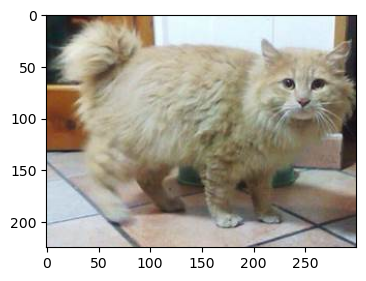

In [7]:
import cv2
import matplotlib.pyplot as plt

# 이미지 읽어오기
image = cv2.cvtColor(cv2.imread(generator.filepaths[3000]), cv2.COLOR_BGR2RGB)

# 이미지 시각화 함수
def show_image(image):
    plt.figure(figsize=(4, 4))
    plt.imshow(image)

show_image(image)

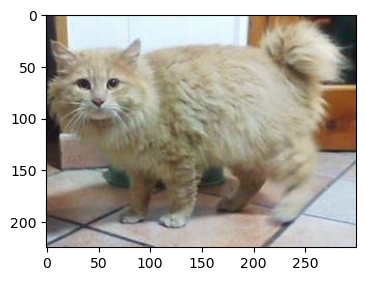

In [8]:
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# horizontal_flip: 좌우 반전 적용
# 적용하더라도 반드시 변환되지는 않고, 특정 확률로 랜덤하게 적용된다
idg = ImageDataGenerator(horizontal_flip=True)

# ImageDataGenerator는 배치 사이즈를 포함한 4차원으로 연산되기 때문에
# 기존 image을 한 차원 증가시켜준다
image_batch = np.expand_dims(image, axis=0)

# 배치 사이즈가 추가된 4차원 이미지를 fit에 전달한다
idg.fit(image_batch)

# fit 이후 flow에 넣어준다
data_generator = idg.flow(image_batch)

# 적용된 이미지를 next로 가져온다
aug_image_batch = next(data_generator)

# 이미지 시각화를 위해 다시 3차원으로 변경시켜준다
aug_image = np.squeeze(aug_image_batch)

# 이미지 값을 실수에서 정수로 변경 후 출력한다
show_image(aug_image.astype('int'))

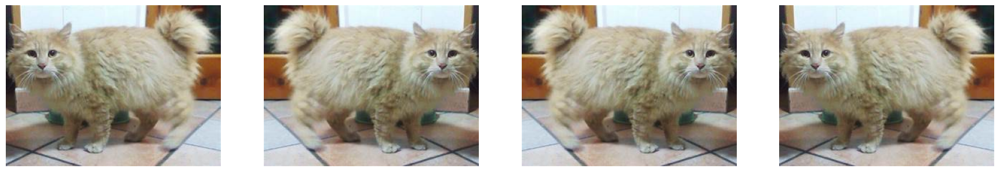

In [9]:
N_IMAGES = 4
fig, axs = plt.subplots(1, N_IMAGES, figsize=(22, 8))

for i in range(N_IMAGES):
    aug_image_batch = next(data_generator)
    aug_image = np.squeeze(aug_image_batch)
    aug_image = aug_image.astype('int')
    axs[i].imshow(aug_image)
    axs[i].axis('off')

In [10]:
# Augmentation과 시각화를 동시에 하는 함수
def show_aug_image_batch(image, idg, n_images=4, to_int=True):
    image_batch = np.expand_dims(image, axis=0)
    
    idg.fit(image_batch)
    data_generator = idg.flow(image_batch)

    fig, axes = plt.subplots(1, n_images, figsize=(n_images * 5, 8))
    
    for i in range(n_images):
        aug_image_batch = next(data_generator)
        aug_image = np.squeeze(aug_image_batch)

        if to_int:
            aug_image = aug_image.astype('int')
            
        axes[i].imshow(aug_image)
        axes[i].axis('off')

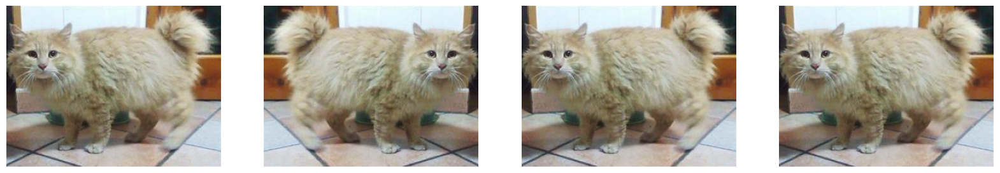

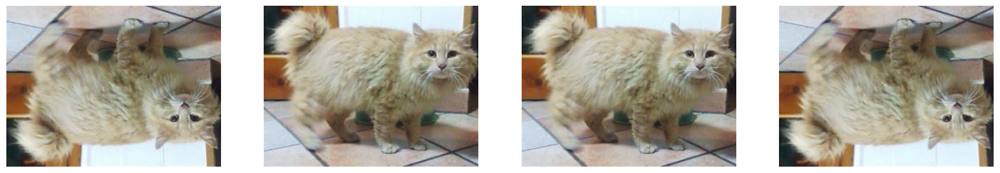

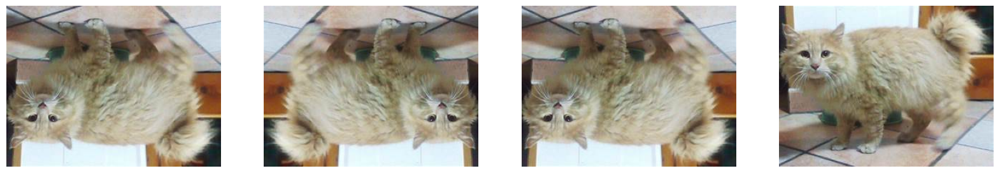

In [11]:
idg = ImageDataGenerator(horizontal_flip=True)
show_aug_image_batch(image, idg)

# vertical_flip: 좌우 반전 적용
idg = ImageDataGenerator(vertical_flip=True)
show_aug_image_batch(image, idg)

idg = ImageDataGenerator(horizontal_flip=True, vertical_flip=True)
show_aug_image_batch(image, idg)

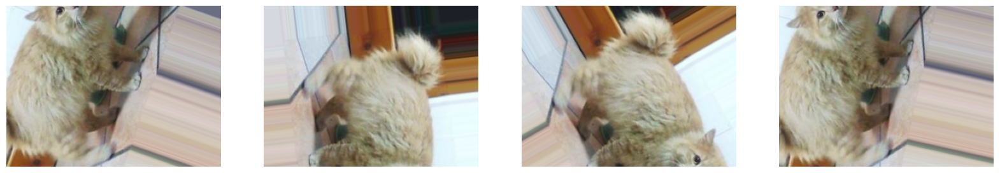

In [12]:
# rotation_range: 0 ~ n도 사이로 랜덤하게 회전
idg = ImageDataGenerator(rotation_range=90)
show_aug_image_batch(image, idg)

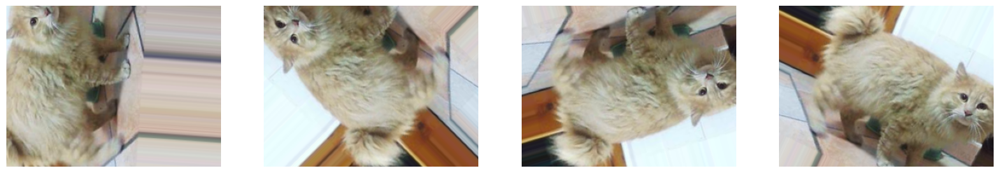

In [13]:
idg = ImageDataGenerator(horizontal_flip=True, vertical_flip=True, rotation_range=90)
show_aug_image_batch(image, idg)

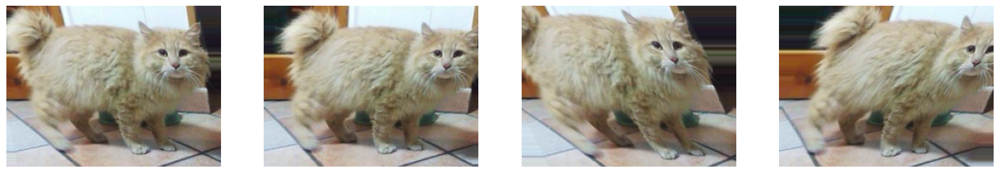

In [14]:
# Shear: 늘리기(0 ~ n)
idg = ImageDataGenerator(shear_range=45)
show_aug_image_batch(image, idg)

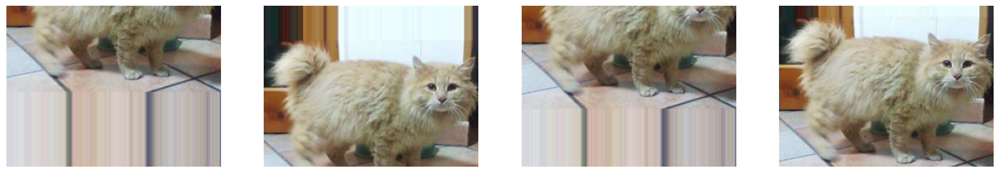

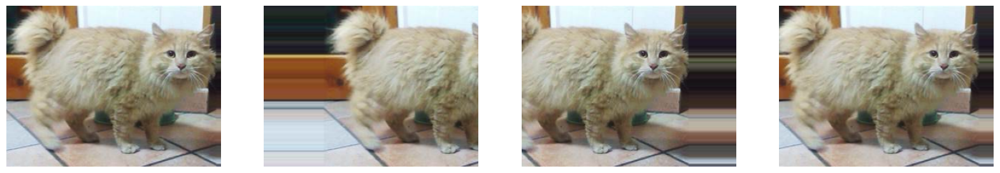

In [15]:
idg = ImageDataGenerator(width_shift_range=0.4)
show_aug_image_batch(image, idg)

idg = ImageDataGenerator(height_shift_range=0.4)
show_aug_image_batch(image, idg)

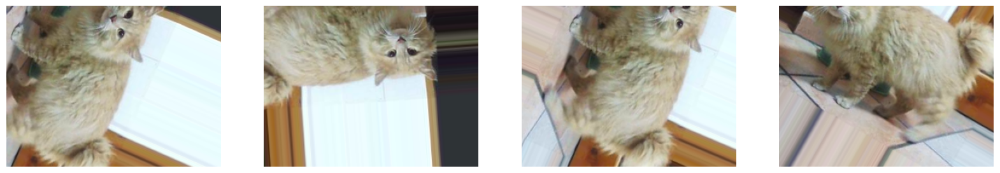

In [16]:
idg = ImageDataGenerator(horizontal_flip=True, vertical_flip=True,rotation_range=90, width_shift_range=0.4, height_shift_range=0.4)
show_aug_image_batch(image, idg)

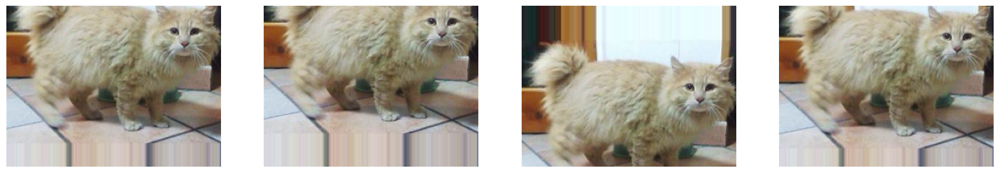

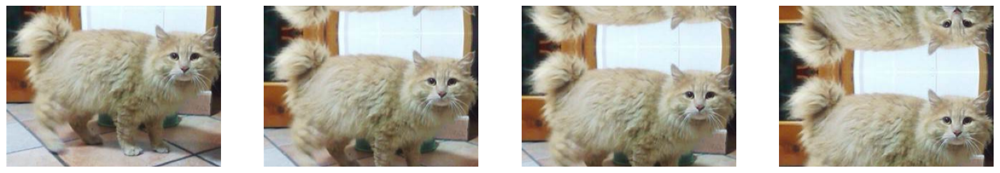

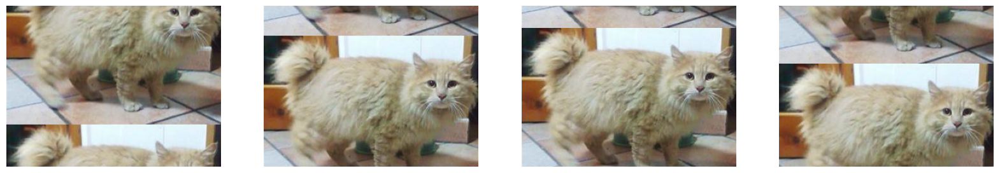

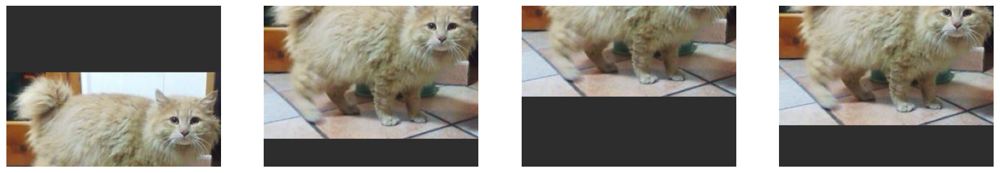

In [17]:
# 빈 공간을 가장 가까운 곳의 픽셀값으로 채우기(default)
idg = ImageDataGenerator(width_shift_range=0.4, fill_mode='nearest')
show_aug_image_batch(image, idg)

# 빈 공간을 해당 영역 근처 공간으로 채우기
idg = ImageDataGenerator(width_shift_range=0.4, fill_mode='reflect')
show_aug_image_batch(image, idg)

# 빈 공간을 잘려나간 이미지로 채우기
idg = ImageDataGenerator(width_shift_range=0.4, fill_mode='wrap')
show_aug_image_batch(image, idg)

# 빈 공간을 특정 픽셀값으로 채우기
idg = ImageDataGenerator(width_shift_range=0.4, fill_mode='constant', cval=45)
show_aug_image_batch(image, idg)

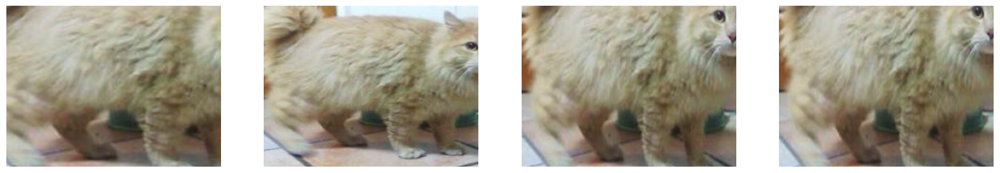

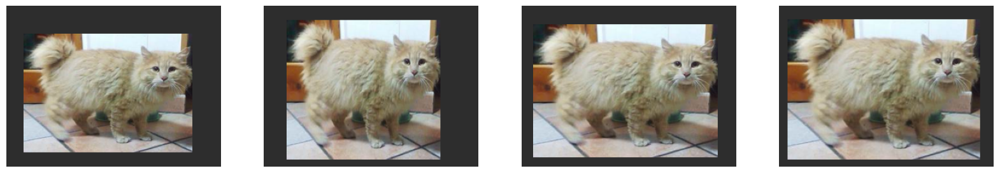

In [18]:
# Zoom in: 확대
# zoom_range가 1보다 작으면 확대된다
idg = ImageDataGenerator(zoom_range=[0.5, 0.9])
show_aug_image_batch(image, idg)

# Zoom out: 축소
# zoom_range가 1보다 크면 축소된다
idg = ImageDataGenerator(zoom_range=[1.1, 1.5], fill_mode='constant', cval=45)
show_aug_image_batch(image, idg)

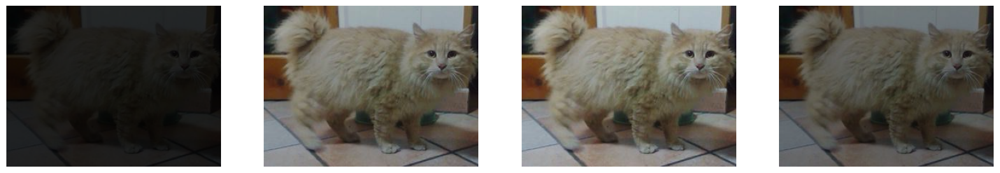

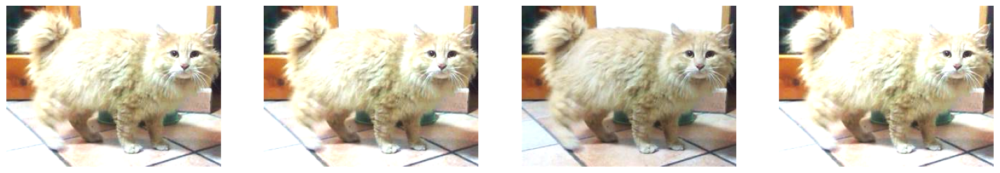

In [19]:
# Brightness: 밝기 조절
# 1보다 작으면 어두워지고, 1보다 크면 밝아진다
idg = ImageDataGenerator(brightness_range=(0.1, 0.9))
show_aug_image_batch(image, idg)

idg = ImageDataGenerator(brightness_range=(1.1, 1.5))
show_aug_image_batch(image, idg)

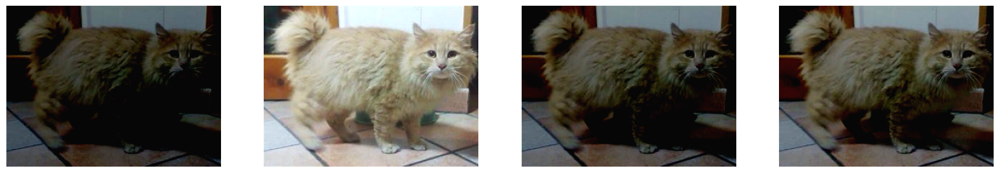

In [20]:
# Channel Shift: 채널 변경
idg = ImageDataGenerator(channel_shift_range=150)
show_aug_image_batch(image, idg)

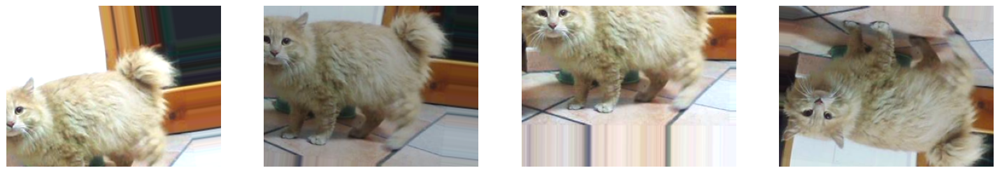

In [21]:
# 위에서 사용한 모든 Augmentation을 ImageDataGenerator 안에 한 번에 사용 가능함
idg = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    brightness_range=(0.7, 1.3),
    horizontal_flip=True,
    vertical_flip=True,
)

show_aug_image_batch(image, idg)

In [22]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

root = './datasets/animals/original/'

idg = ImageDataGenerator(rescale=1./255)

generator = idg.flow_from_directory(
    root,
    target_size=(250, 250),
    batch_size=32,
    class_mode='categorical'
)

print(generator.class_indices)

Found 26179 images belonging to 10 classes.
{'butterfly': 0, 'cat': 1, 'chicken': 2, 'cow': 3, 'dog': 4, 'elephant': 5, 'horse': 6, 'sheep': 7, 'spider': 8, 'squirrel': 9}


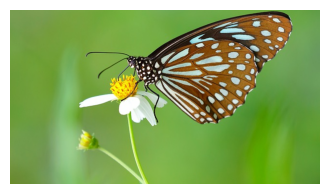

In [23]:
import cv2
import matplotlib.pyplot as plt

# 이미지 읽어오기
image = cv2.cvtColor(cv2.imread(generator.filepaths[803]), cv2.COLOR_BGR2RGB)

# 이미지 표시 함수
def show_image(image):
    plt.figure(figsize=(4, 4))
    plt.imshow(image)
    plt.axis('off')

show_image(image)

In [24]:
# conda install -c conda-forge albumentations

In [27]:
def show_images(images, targets, ncols=4, title=None):
    figure, axes = plt.subplots(figsize=(ncols * 5, 4), nrows=1, ncols=ncols)
    for i in range(ncols):
        axes[i].imshow(images[i])
        axes[i].set_title(targets[i])

def repeat_aug(original_image=None, target=None, aug=None, ncols=2):
    image_list = [original_image]
    target_list = ['Original']

    aug_image = aug(image=original_image)['image']
    image_list.append(aug_image)
    target_list.append(target)

    show_images(image_list, target_list, ncols=ncols)

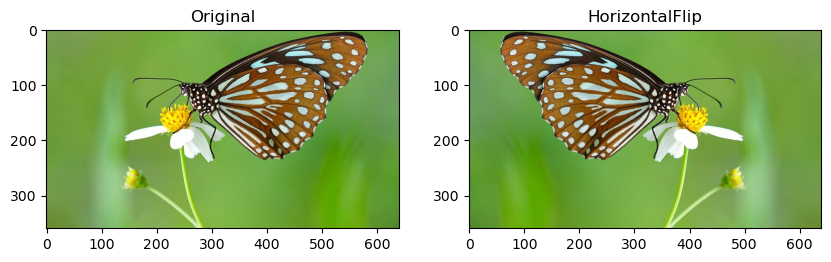

In [29]:
import albumentations as A

# p: augment 적용 확률 (1로 설정하면 반드시 적용)
aug = A.HorizontalFlip(p=0.5)

# __call__ 함수의 원리
aug_image = aug(image=image)['image']


repeat_aug(original_image=image, target='HorizontalFlip', aug=aug)

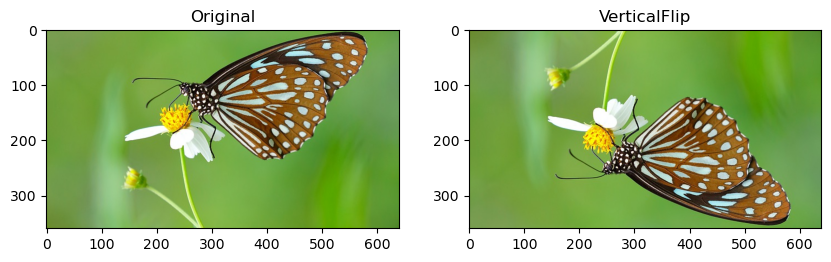

In [30]:
aug = A.VerticalFlip(p=0.5)
aug_image = aug(image=image)['image']

repeat_aug(original_image=image, target='VerticalFlip', aug=aug)

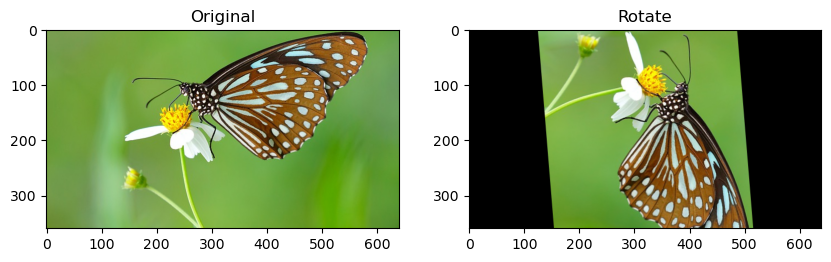

In [31]:
# limit=90: -90 ~ 90도 사이로 랜덤하게 회전
aug = A.Rotate(p=1, limit=90, border_mode=cv2.BORDER_CONSTANT)

repeat_aug(original_image=image, target='Rotate', aug=aug)

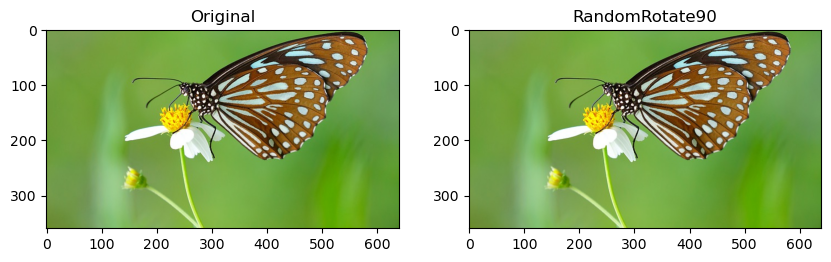

In [32]:
# limit=90: -90 ~ 90도 사이로 랜덤하게 회전
aug = A.RandomRotate90(p=1)

repeat_aug(original_image=image, target='RandomRotate90', aug=aug)

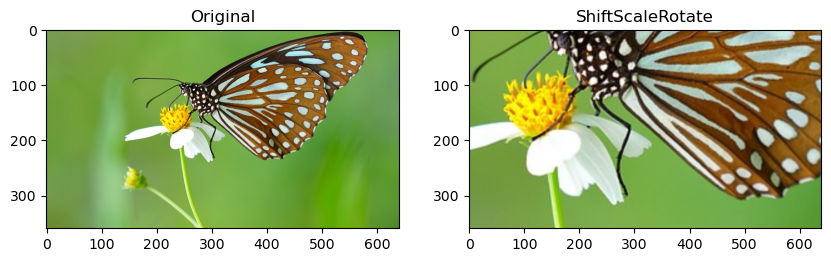

In [33]:
# shift, scale(zoom), rotate를 함께 또는 별개로 적용
# 별개로 적용할 경우, 나머지는 0으로 설정
aug = A.ShiftScaleRotate(shift_limit=0, scale_limit=(-0.8, 1.5), rotate_limit=0, border_mode=cv2.BORDER_CONSTANT, p=1)

repeat_aug(original_image=image, target='ShiftScaleRotate', aug=aug)

In [34]:
def show_images(images, targets, ncols=4, title=None):
    figure, axes = plt.subplots(figsize=(ncols * 5, 4), nrows=1, ncols=ncols)
    for i in range(ncols):
        axes[i].imshow(images[i])
        axes[i].set_title(targets[i])

def repeat_aug(original_image=None, target=None, aug=None, ncols=2):
    image_list = [original_image]
    target_list = ['Original']

    for i in range(ncols):
        aug_image = aug(image=original_image)['image']
        image_list.append(aug_image)
        target_list.append(target)

    show_images(image_list, target_list, ncols=ncols)

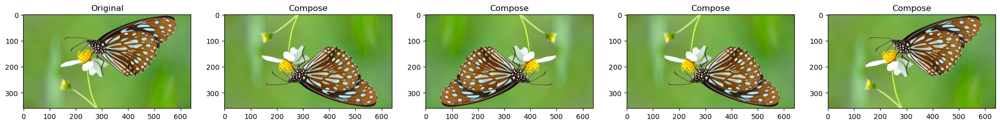

In [35]:
# Compose: 여러 Augmentation 동시 실행
# Compose도 고유의 p(확률) 값을 가진다
aug = A.Compose([
    A.VerticalFlip(p=0.5),
    A.HorizontalFlip(p=0.5)
])

repeat_aug(original_image=image, target='Compose', aug=aug, ncols=5)

(100, 50, 3)

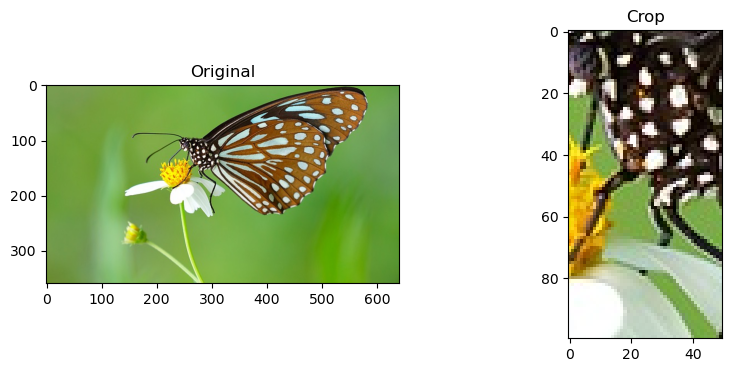

In [36]:
# 특정 영역을 잘라낸 후 원본 사이즈로 다시 Resize하지 않음
# x: width, y:height, max값은 이미지 크기로 설정해야한다.
# 범위가 아닌 지정한 부분을 제외한 나머지를 가져온다
aug = A.Crop(x_min=250, y_min=100, x_max=300, y_max=200, p=1)
repeat_aug(original_image=image, target='Crop', aug=aug)

aug(image=image)['image'].shape

(250, 250, 3)

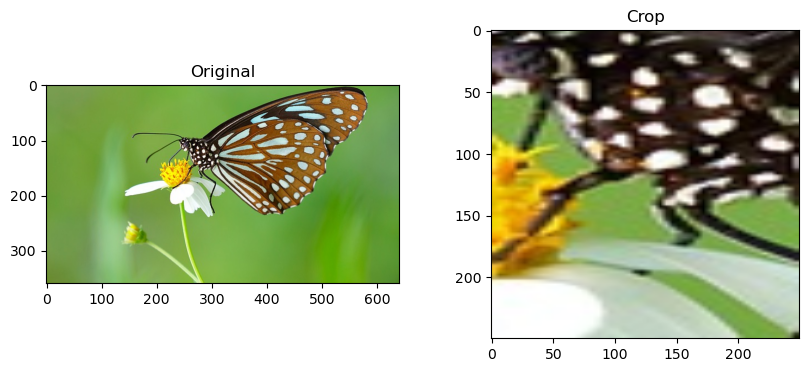

In [37]:
# 모델 훈련 시, 사용되는 이미지 크기(가로 * 세로)를 전부 동일하게 맞춰줘야 하기 때문에
# Crop과 Resize를 병행한다
aug = A.Compose([
    A.Crop(x_min=250, y_min=100, x_max=300, y_max=200, p=1),
    A.Resize(250, 250)
])

repeat_aug(original_image=image, target='Crop', aug=aug)
aug(image=image)['image'].shape

(100, 200, 3)

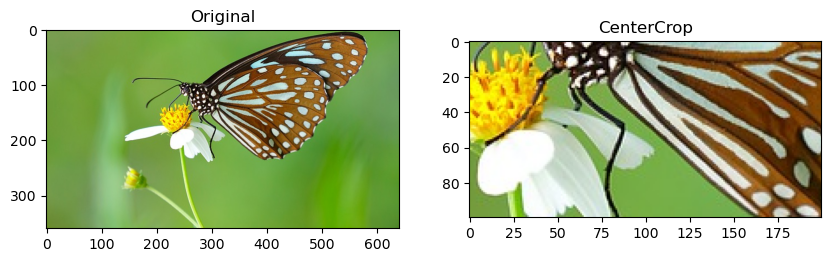

In [38]:
# 이미지의 가운데 부분 Crop
aug = A.CenterCrop(width=200, height=100, p=1)
repeat_aug(original_image=image, target='CenterCrop', aug=aug)

aug(image=image)['image'].shape

(250, 250, 3)

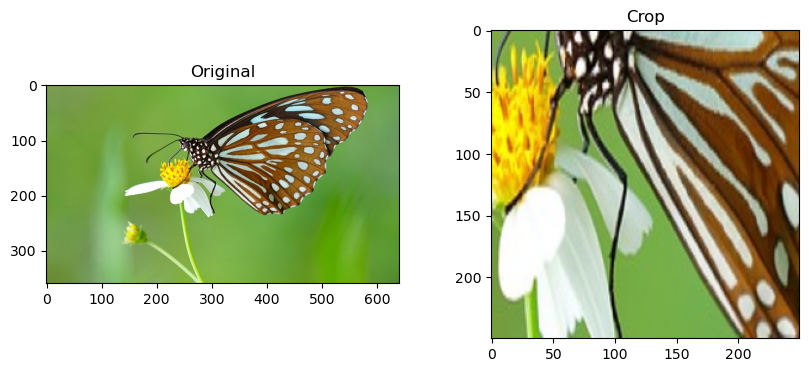

In [39]:
aug = A.Compose([
    A.CenterCrop(width=200, height=100, p=1),
    A.Resize(250, 250)
])

repeat_aug(original_image=image, target='Crop', aug=aug)
aug(image=image)['image'].shape

(100, 200, 3)

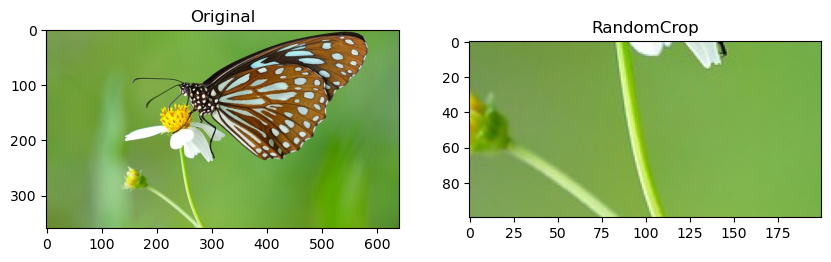

In [40]:
# 랜덤 위치에서 Crop
aug = A.RandomCrop(width=200, height=100, p=1)
repeat_aug(original_image=image, target='RandomCrop', aug=aug)

aug(image=image)['image'].shape

(250, 250, 3)

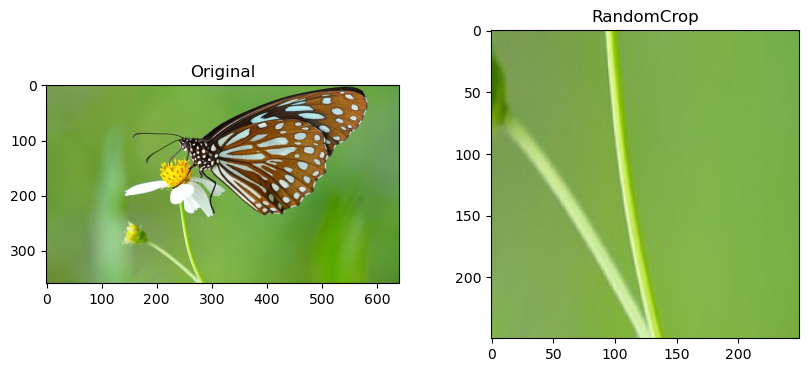

In [41]:
aug = A.Compose([
    A.RandomCrop(height=100, width=200, p=1),
    A.Resize(250, 250)
])

repeat_aug(original_image=image, target='RandomCrop', aug=aug)
aug(image=image)['image'].shape

(250, 250, 3)

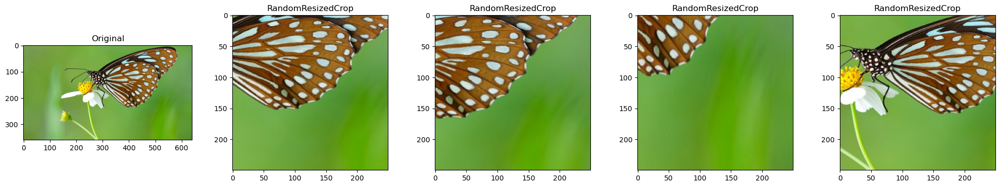

In [42]:
# scale 범위만큼 Crop + width, height로 Resize
# ex. 원본 이미지가 100 * 100일 때 scale(0.1, 0.5)를 적용하면
# 10 ~ 50% 범위만큼 랜덤하게 잘라낸 후 Resize한다
aug = A.RandomResizedCrop(width=250, height=250, scale=(0.2, 0.5), p=1)
repeat_aug(original_image=image, target='RandomResizedCrop', aug=aug, ncols=5)

aug(image=image)['image'].shape

(360, 640, 3)

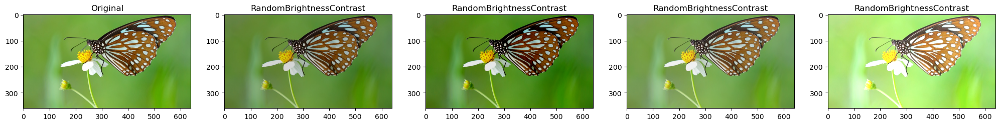

In [43]:
# 밝기 및 대비 변경
# 밝기와 대비를 따로 적용 하고싶다면, 다른 한 쪽을 0으로 두면 된다
aug = A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=1)
repeat_aug(original_image=image, target='RandomBrightnessContrast', aug=aug, ncols=5)

aug(image=image)['image'].shape

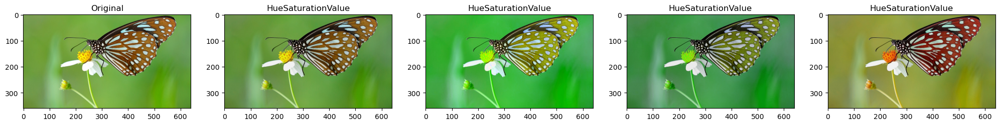

In [44]:
# 색상, 채도, 명도
# hue_shift_limit
# sat_shift_limit
# val_shift_limit
aug = A.HueSaturationValue(p=1)
repeat_aug(original_image=image, target='HueSaturationValue', aug=aug, ncols=5)

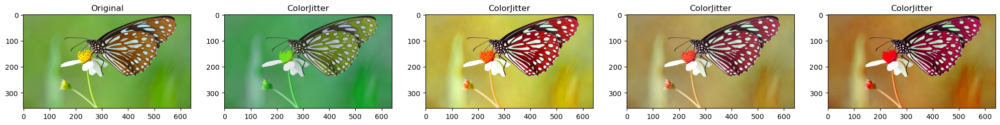

In [45]:
# 밝기, 대비, 채도, 색상
aug = A.ColorJitter(p=1)
repeat_aug(original_image=image, target='ColorJitter', aug=aug, ncols=5)

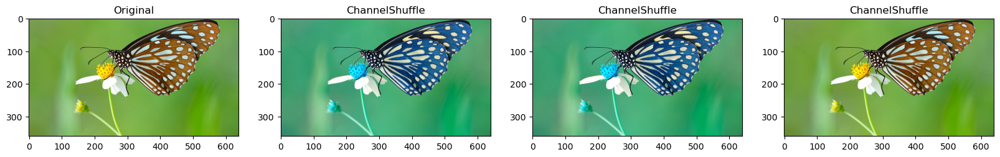

In [46]:
# 채널 위치 변경
aug = A.ChannelShuffle(p=1)
repeat_aug(original_image=image, target='ChannelShuffle', aug=aug, ncols=4)

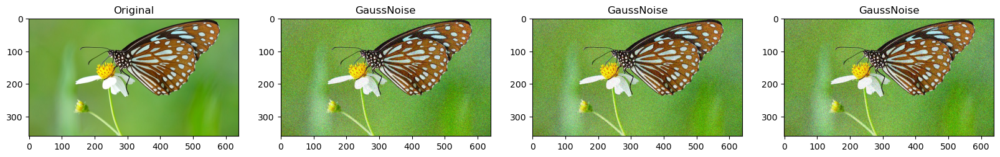

In [47]:
# 가우시안 분포(정규분포)를 사용해서 노이즈 생성
aug = A.GaussNoise(p=1, var_limit=(400, 900))
repeat_aug(original_image=image, target='GaussNoise', aug=aug, ncols=4)

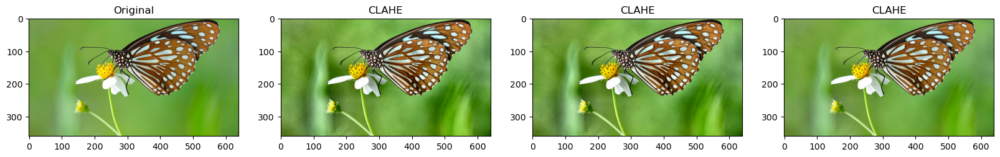

In [48]:
# 명암 대비 선명도 조정
aug = A.CLAHE(p=1, clip_limit=4)
repeat_aug(original_image=image, target='CLAHE', aug=aug, ncols=4)

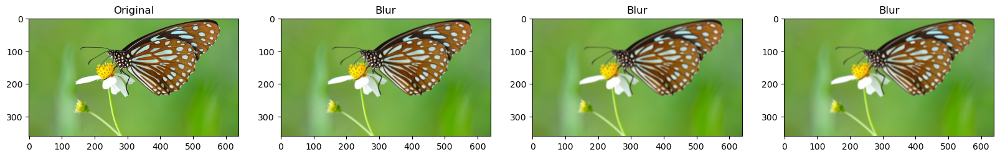

In [49]:
# 블러 처리(흐리게)
aug = A.Blur(p=1, blur_limit=(3, 5))
repeat_aug(original_image=image, target='Blur', aug=aug, ncols=4)

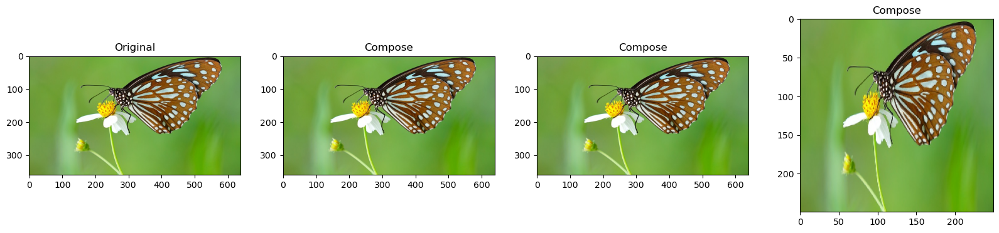

In [50]:
# 위에서 사용한 Augmntation 동시 실행
# 50% 확률로 원본 이미지(Augmentation 미실행) 출력
aug = A.Compose([
    A.CenterCrop(height=100, width=100, p=0.5),
    A.HorizontalFlip(p=0.5),
    A.RandomBrightnessContrast(p=0.5),
    A.Resize(250, 250, p=1)
], p=0.5)

repeat_aug(original_image=image, target='Compose', aug=aug, ncols=4)

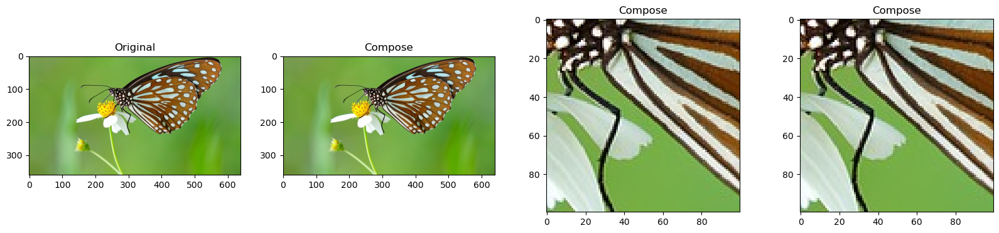

In [51]:
# OneOf: 리스트 안 Augmentation 중 하나만 골라서 적용
aug = A.OneOf([
    A.CenterCrop(height=100, width=100, p=0.5),
    A.HorizontalFlip(p=0.5),
    A.RandomBrightnessContrast(p=0.5),
    A.Resize(250, 250, p=1)
], p=0.5)

repeat_aug(original_image=image, target='Compose', aug=aug, ncols=4)

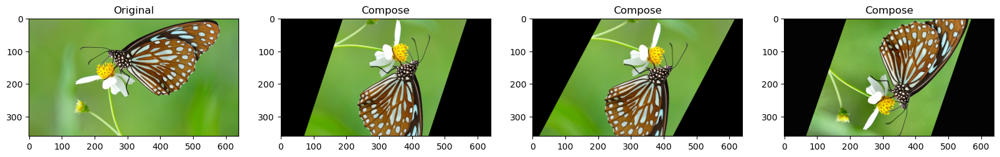

In [52]:
# Compose와 OneOf 병행 예시
# 50% 확률로 좌우/상하 반전 + 45~90도 회전 + (노이즈/블러 중 하나) 적용
aug = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=1),
    A.Rotate(limit=(45, 90), p=1, border_mode=cv2.BORDER_CONSTANT),
    A.OneOf([
        A.CLAHE(p=0.3),
        A.Blur(blur_limit=(10, 15), p=0.3)
    ], p=0.5)
])

repeat_aug(original_image=image, target='Compose', aug=aug, ncols=4)

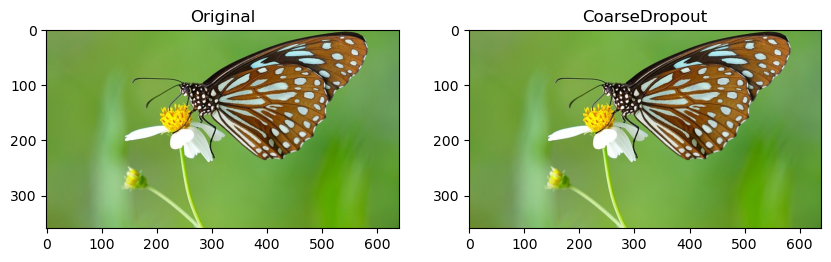

In [53]:
# 검은 정사각형을 랜덤 배치해서 노이즈를 발생시킨다
# 별도의 파라미터로 노이즈 색을 바꿀 수 있다
aug = A.CoarseDropout(max_holes=100, max_height=10, max_width=10, p=0.5)
repeat_aug(original_image=image, target='CoarseDropout', aug=aug)

### 🚩 정리
#### 기본적으로 많이 사용되는 변화는 다음과 같다.

- Vertical
- Horizontal
- ShiftScaleRotation
- RandomCrop, CenterCrop
- RandomBrightnessContrast
- ColorJitter
- CLAHE
- Blur
- CoarseDropout

In [54]:
import albumentations as A
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# 이미지 Augmentation 함수
# Compose의 확률을 0.5로 지정하는 이유는, 원본 데이터도 입력하기 위함
def transform(image):
    aug = A.Compose([
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),
        A.OneOf([
            A.ColorJitter(p=0.5),
            A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.5)
        ], p=1)
    ], p=0.5)

    return aug(image=image)['image']

# 위 함수를 ImageDataGenerator를 불러올 때 같이 실행
idg = ImageDataGenerator(preprocessing_function=transform, rescale=1./255)